In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import chess
from chess import pgn
from chess import Board
import archives_manager
from pawn_structure_analysis import PawnStructureAnalysis
import io

pd.set_option('display.max_rows', None)
pd.set_option('display.width', 10000)

In [2]:
player_name = "BIG_TONKA_T"
start_unix = 1696176000 # oct 1st 2023
end_unix = 1698768000 # same time, oct 31st 2023

game_archive = archives_manager.get_games_between_timestamps(player_name, start_unix, end_unix, time_class='rapid', filter_func=archives_manager.build_archive_filter(
    rated=True,
    exclude_draws=True
))

In [3]:
game_archive[0]

{'url': 'https://www.chess.com/game/live/89923795267',
 'pgn': '[Event "Live Chess"]\n[Site "Chess.com"]\n[Date "2023.10.01"]\n[Round "-"]\n[White "Quarini"]\n[Black "BIG_TONKA_T"]\n[Result "0-1"]\n[CurrentPosition "r4rk1/1p4pp/1n1p2n1/p1pP4/2P1B3/PP3PP1/2QBNK1P/q7 b - -"]\n[Timezone "UTC"]\n[ECO "A04"]\n[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation-2.g3"]\n[UTCDate "2023.10.01"]\n[UTCTime "18:26:14"]\n[WhiteElo "1056"]\n[BlackElo "1097"]\n[TimeControl "600"]\n[Termination "BIG_TONKA_T won by resignation"]\n[StartTime "18:26:14"]\n[EndDate "2023.10.01"]\n[EndTime "18:31:38"]\n[Link "https://www.chess.com/game/live/89923795267"]\n\n1. Nf3 {[%clk 0:10:00]} 1... e6 {[%clk 0:10:00]} 2. g3 {[%clk 0:09:59.1]} 2... d6 {[%clk 0:09:59.5]} 3. Bg2 {[%clk 0:09:58.6]} 3... Nd7 {[%clk 0:09:58.8]} 4. d4 {[%clk 0:09:58.1]} 4... Ne7 {[%clk 0:09:57.8]} 5. e4 {[%clk 0:09:57.5]} 5... Nb6 {[%clk 0:09:56.2]} 6. Nc3 {[%clk 0:09:56.3]} 6... Bd7 {[%clk 0:09:55.5]} 7. b3 {[%clk 0

In [4]:
game_archive[0]['pgn']

'[Event "Live Chess"]\n[Site "Chess.com"]\n[Date "2023.10.01"]\n[Round "-"]\n[White "Quarini"]\n[Black "BIG_TONKA_T"]\n[Result "0-1"]\n[CurrentPosition "r4rk1/1p4pp/1n1p2n1/p1pP4/2P1B3/PP3PP1/2QBNK1P/q7 b - -"]\n[Timezone "UTC"]\n[ECO "A04"]\n[ECOUrl "https://www.chess.com/openings/Reti-Opening-Queens-Gambit-Invitation-2.g3"]\n[UTCDate "2023.10.01"]\n[UTCTime "18:26:14"]\n[WhiteElo "1056"]\n[BlackElo "1097"]\n[TimeControl "600"]\n[Termination "BIG_TONKA_T won by resignation"]\n[StartTime "18:26:14"]\n[EndDate "2023.10.01"]\n[EndTime "18:31:38"]\n[Link "https://www.chess.com/game/live/89923795267"]\n\n1. Nf3 {[%clk 0:10:00]} 1... e6 {[%clk 0:10:00]} 2. g3 {[%clk 0:09:59.1]} 2... d6 {[%clk 0:09:59.5]} 3. Bg2 {[%clk 0:09:58.6]} 3... Nd7 {[%clk 0:09:58.8]} 4. d4 {[%clk 0:09:58.1]} 4... Ne7 {[%clk 0:09:57.8]} 5. e4 {[%clk 0:09:57.5]} 5... Nb6 {[%clk 0:09:56.2]} 6. Nc3 {[%clk 0:09:56.3]} 6... Bd7 {[%clk 0:09:55.5]} 7. b3 {[%clk 0:09:55.2]} 7... Ng6 {[%clk 0:09:54.5]} 8. Bb2 {[%clk 0:09:54.4]

In [3]:
game_info = []
pawn_structure_features = []

for i in range(len(game_archive)):
    game = game_archive[i]
    won = archives_manager.get_won(game, player_name)
    color = archives_manager.get_color(game, player_name)
    pawn_structure_analysis = PawnStructureAnalysis(Board())
    game_pgn = game['pgn']
    chess_game = pgn.read_game(io.StringIO(game_pgn))

    total_move_count = 0
    for move in chess_game.mainline_moves():
        total_move_count += 1

    move_count = 0

    for move in chess_game.mainline_moves():
        move_count += 1

        is_player_turn = pawn_structure_analysis.board.turn == color
        if not is_player_turn:
            pawn_structure_analysis.push_move(move)
            continue

        game_percentage = move_count / total_move_count

        white_pawns = pawn_structure_analysis.count_pawns(chess.WHITE)
        black_pawns = pawn_structure_analysis.count_pawns(chess.BLACK)
        white_shiftness, white_shiftness_var = pawn_structure_analysis.calculate_shiftness(chess.WHITE)
        black_shiftness, black_shiftness_var = pawn_structure_analysis.calculate_shiftness(chess.BLACK)
        white_forwardness, white_forwardness_var = pawn_structure_analysis.calculate_forwardness(chess.WHITE)
        black_forwardness, black_forwardness_var = pawn_structure_analysis.calculate_forwardness(chess.BLACK)
        white_isolated_pawns = pawn_structure_analysis.count_isolated_pawns(chess.WHITE)
        black_isolated_pawns = pawn_structure_analysis.count_isolated_pawns(chess.BLACK)
        blockades = pawn_structure_analysis.count_blockades()
        tension = pawn_structure_analysis.measure_tension()
        white_passed_pawns = pawn_structure_analysis.count_passed_pawns(chess.WHITE)
        black_passed_pawns = pawn_structure_analysis.count_passed_pawns(chess.BLACK)
        white_doubled_pawns = pawn_structure_analysis.count_doubled_pawns(chess.WHITE)
        black_doubled_pawns = pawn_structure_analysis.count_doubled_pawns(chess.BLACK)
        open_files = pawn_structure_analysis.count_open_files()
        semi_open_black_files = pawn_structure_analysis.count_semi_open_black_files()
        semi_open_white_files = pawn_structure_analysis.count_semi_open_white_files()
        closed_files = pawn_structure_analysis.count_closed_files()

        game_info.append({
            # info
            'game_number': i,
            'move_count': move_count,
            'game_percentage': game_percentage,
            'won': won,
            'color': color,
            'to_move': pawn_structure_analysis.board.turn
        })

        pawn_structure_features.append({
            # features
            'white_pawns': white_pawns,
            'black_pawns': black_pawns,
            'white_shiftness': white_shiftness,
            'white_shiftness_var': white_shiftness_var,
            'black_shiftness': black_shiftness,
            'black_shiftness_var': black_shiftness_var,
            'white_forwardness': white_forwardness,
            'white_forwardness_var': white_forwardness_var,
            'black_forwardness': black_forwardness,
            'black_forwardness_var': black_forwardness_var,
            'white_isolated_pawns': white_isolated_pawns,
            'black_isolated_pawns': black_isolated_pawns,
            'blockades': blockades,
            'tension': tension,
            'white_passed_pawns': white_passed_pawns,
            'black_passed_pawns': black_passed_pawns,
            'white_doubled_pawns': white_doubled_pawns,
            'black_doubled_pawns': black_doubled_pawns,
            'open_files': open_files,
            'semi_open_black_files': semi_open_black_files,
            'semi_open_white_files': semi_open_white_files,
            'closed_files': closed_files
        })

        pawn_structure_analysis.push_move(move)

pawn_structure_df = pd.DataFrame(pawn_structure_features)
game_info_df = pd.DataFrame(game_info)

In [4]:
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, KFold
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

In [5]:
X = pawn_structure_df
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

y = game_info_df['won']

In [6]:
kf = KFold(n_splits=5, shuffle=True, random_state=42)
accuracy_scores = {}
explained_variance = {}
p = 12

for n_components in range(1, p + 1):
    pca = PCA(n_components=n_components)
    logistic = LogisticRegression()

    pipeline = Pipeline(steps=[('pca', pca), ('logistic', logistic)])

    score = cross_val_score(pipeline, X_scaled, y, cv=kf, scoring='accuracy')
    accuracy_scores[n_components] = np.mean(score)

    pca.fit(X_scaled)
    explained_variance[n_components] = np.sum(pca.explained_variance_ratio_)

for components in range(1, p + 1):
    accuracy = accuracy_scores[components]
    total_explained_variance = explained_variance[components]
    print(f"Number of Components: {components}, Accuracy: {accuracy:.4f}, Total Explained Variance: {total_explained_variance:.4f}")

Number of Components: 1, Accuracy: 0.5371, Total Explained Variance: 0.2751
Number of Components: 2, Accuracy: 0.5371, Total Explained Variance: 0.3794
Number of Components: 3, Accuracy: 0.5371, Total Explained Variance: 0.4642
Number of Components: 4, Accuracy: 0.5393, Total Explained Variance: 0.5368
Number of Components: 5, Accuracy: 0.5398, Total Explained Variance: 0.6001
Number of Components: 6, Accuracy: 0.5400, Total Explained Variance: 0.6542
Number of Components: 7, Accuracy: 0.5402, Total Explained Variance: 0.7002
Number of Components: 8, Accuracy: 0.5410, Total Explained Variance: 0.7417
Number of Components: 9, Accuracy: 0.5406, Total Explained Variance: 0.7819
Number of Components: 10, Accuracy: 0.5406, Total Explained Variance: 0.8162
Number of Components: 11, Accuracy: 0.5408, Total Explained Variance: 0.8496
Number of Components: 12, Accuracy: 0.5376, Total Explained Variance: 0.8774


In [7]:
# pick the number of principal components based on the logistic regression accuracies and explained variance
num_components = 8

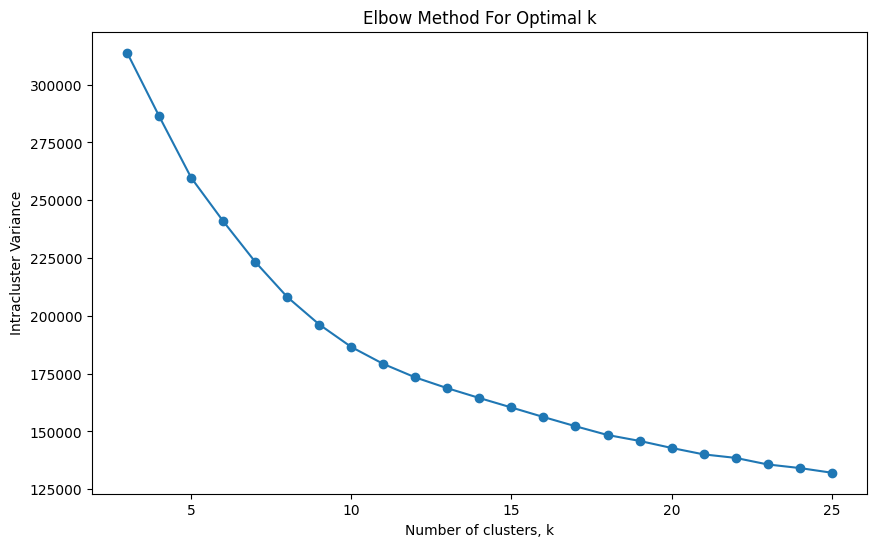

In [8]:
from sklearn.cluster import KMeans

pca = PCA(n_components=num_components)
X_pca = pca.fit_transform(X_scaled)

# do k-means clustering, from k = 3 to k = 25 and record intracluster_variances
k_values = range(3, 25 + 1)
intracluster_variances = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=42)
    kmeans.fit(X_pca)
    intracluster_variances.append(kmeans.inertia_)

# Plotting the Elbow Method Graph
plt.figure(figsize=(10, 6))
plt.plot(k_values, intracluster_variances, marker='o')
plt.title('Elbow Method For Optimal k')
plt.xlabel('Number of clusters, k')
plt.ylabel('Intracluster Variance')
plt.show()

In [9]:
# pick a number of clusters from the elbow graph
num_clusters = 12

In [10]:
# final parameterized clustering

pca = PCA(n_components=num_components)
X_pca = pca.fit_transform(X_scaled)

kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=42)
kmeans.fit(X_pca)

KMeans(n_clusters=12, n_init=10, random_state=42)

In [11]:
(unique, counts) = np.unique(kmeans.labels_, return_counts=True)
cluster_sizes = dict(zip(unique, counts))
print("Cluster Sizes:", cluster_sizes)

Cluster Sizes: {0: 4016, 1: 1330, 2: 872, 3: 1931, 4: 1567, 5: 978, 6: 1070, 7: 2588, 8: 9246, 9: 1109, 10: 1457, 11: 4628}


In [12]:
game_info_df['structure_cluster'] = kmeans.labels_
print(game_info_df)

       game_number  move_count  game_percentage  won  color  to_move  structure_cluster
0                0           2         0.042553    1  False    False                  8
1                0           4         0.085106    1  False    False                  8
2                0           6         0.127660    1  False    False                  8
3                0           8         0.170213    1  False    False                  8
4                0          10         0.212766    1  False    False                  8
5                0          12         0.255319    1  False    False                  8
6                0          14         0.297872    1  False    False                  8
7                0          16         0.340426    1  False    False                  8
8                0          18         0.382979    1  False    False                  7
9                0          20         0.425532    1  False    False                 11
10               0          22  

In [13]:
def chessboard_at(game_number, move_count):
    board = Board()
    game = game_archive[game_number]
    game_pgn = game['pgn']
    chess_game = pgn.read_game(io.StringIO(game_pgn))
    this_move_count = 0
    for move in chess_game.mainline_moves():
        this_move_count += 1
        if move_count == this_move_count:
            return board
        board.push(move)

In [14]:
print(chessboard_at(game_number=0, move_count=2))

r n b q k b n r
p p p p p p p p
. . . . . . . .
. . . . . . . .
. . . . . . . .
. . . . . N . .
P P P P P P P P
R N B Q K B . R


In [15]:
sampled_indices_dict = game_info_df.groupby('structure_cluster').apply(lambda x: x.sample(n=5, random_state=42).index).to_dict()

for cluster, indices in sampled_indices_dict.items():
    print(f"Cluster {cluster}: {list(indices)}")
    for index in indices:
        row = game_info_df.iloc[index]
        print(chessboard_at(row['game_number'], row['move_count']), '\n')


Cluster 0: [9471, 10290, 22391, 11036, 28824]


r . b r . . . .
p . k . . . p p
. b p . p p . .
. . . . . . . .
N p B . P . . .
. . . . . N P n
P P . . . P K P
. . R . . R . . 

r . r . . . k .
p . . q . . p p
. p . b . p . .
. b . . . . . .
. P . B . . . Q
. . P P N N . .
. . . R . P P P
R . . . . . K . 

r . . . . r k .
. p . . . p p .
. . p . . . . B
p . . . . . . .
. . . p P n R .
P . . P . . . .
. P P . . . . P
. . . . . R K . 

r . . . . . . .
p . p . . . p p
. . . . p k . .
. . P . . . . R
. P . . . . . .
P . . . n . P .
. . . . . . . P
. . . . . . . K 

. k . r . r . .
p p p . q p . p
. . . . . . p .
. . . . . . . .
. P . n P . . .
P . Q P . . N .
. . . . . . P P
R . . . R . . K 

Cluster 1: [22767, 2792, 13135, 5761, 1702]
r . . n . . . r
. p . n k . . .
. . . . p b p .
p . . . p . . .
. . P p . . B p
. . . P . N . .
P P . . . . P .
R . B . . R K . 

. . . . r r k .
. p . . . p p p
. q . . . . n .
. . . R . . . .
p . . p . . Q .
. . P . P . . .
P P . . . . P P
R . B . . . K . 

. r . . . r k .
p . . . . p p p
. q . N p . .

In [16]:
cluster_winningness_white = game_info_df[game_info_df['color'] == chess.WHITE].groupby('structure_cluster').apply(lambda x: x['won'].mean()).to_dict()

cluster_winningness_white

{0: 0.5276200309757356,
 1: 0.5662460567823344,
 2: 0.5987261146496815,
 3: 0.5993340732519423,
 4: 0.4409221902017291,
 5: 0.7987679671457906,
 6: 0.3561643835616438,
 7: 0.5418848167539267,
 8: 0.5338282078472959,
 9: 0.4395924308588064,
 10: 0.48050314465408805,
 11: 0.5523156089193825}

In [17]:
cluster_winningness_black = game_info_df[game_info_df['color'] == chess.BLACK].groupby('structure_cluster').apply(lambda x: x['won'].mean()).to_dict()

cluster_winningness_black

{0: 0.5959595959595959,
 1: 0.42528735632183906,
 2: 0.4513715710723192,
 3: 0.45728155339805826,
 4: 0.6403207331042382,
 5: 0.384928716904277,
 6: 0.7800632911392406,
 7: 0.5159500693481276,
 8: 0.5283601853895388,
 9: 0.6255924170616114,
 10: 0.4954682779456193,
 11: 0.5300522648083623}

In [18]:
cluster_advantage = {}

for cluster, winningness in cluster_winningness_white.items():
    white_advantage = winningness - 0.5
    black_winningness = cluster_winningness_black[cluster]
    black_advantage = black_winningness - 0.5
    print(f'Cluster {cluster}: {round(white_advantage, 3)} v.s. {round(black_advantage, 3)}')
    cluster_advantage[cluster] = [white_advantage, black_advantage]

print('')

for cluster, advantage in cluster_advantage.items():
    print(f'Cluster {cluster} Advantage: {round(advantage[0] + advantage[1], 4)}')

Cluster 0: 0.028 v.s. 0.096
Cluster 1: 0.066 v.s. -0.075
Cluster 2: 0.099 v.s. -0.049
Cluster 3: 0.099 v.s. -0.043
Cluster 4: -0.059 v.s. 0.14
Cluster 5: 0.299 v.s. -0.115
Cluster 6: -0.144 v.s. 0.28
Cluster 7: 0.042 v.s. 0.016
Cluster 8: 0.034 v.s. 0.028
Cluster 9: -0.06 v.s. 0.126
Cluster 10: -0.019 v.s. -0.005
Cluster 11: 0.052 v.s. 0.03

Cluster 0 Advantage: 0.1236
Cluster 1 Advantage: -0.0085
Cluster 2 Advantage: 0.0501
Cluster 3 Advantage: 0.0566
Cluster 4 Advantage: 0.0812
Cluster 5 Advantage: 0.1837
Cluster 6 Advantage: 0.1362
Cluster 7 Advantage: 0.0578
Cluster 8 Advantage: 0.0622
Cluster 9 Advantage: 0.0652
Cluster 10 Advantage: -0.024
Cluster 11 Advantage: 0.0824


In [29]:
for index, row in game_info_df.iterrows():
    if row['color'] == chess.WHITE:
        game_info_df.at[index, 'structure_advantage'] = cluster_advantage[row['structure_cluster']][0]
    elif row['color'] == chess.BLACK:
        game_info_df.at[index, 'structure_advantage'] = cluster_advantage[row['structure_cluster']][1]

print(game_info_df)

       game_number  move_count  game_percentage  won  color  to_move  structure_cluster structure_advantage
0                0           2         0.042553    1  False    False                  8             0.02836
1                0           4         0.085106    1  False    False                  8             0.02836
2                0           6         0.127660    1  False    False                  8             0.02836
3                0           8         0.170213    1  False    False                  8             0.02836
4                0          10         0.212766    1  False    False                  8             0.02836
5                0          12         0.255319    1  False    False                  8             0.02836
6                0          14         0.297872    1  False    False                  8             0.02836
7                0          16         0.340426    1  False    False                  8             0.02836
8                0          

In [32]:
game_avg_cluster_advantage = game_info_df.groupby('game_number').apply(lambda x: x['structure_advantage'].mean()).to_dict()

game_avg_cluster_advantage

{0: 0.02823743757918589,
 1: 0.07214844681373521,
 2: 0.0701496455532341,
 3: 0.04632670967125768,
 4: 0.011100863586474264,
 5: 0.04172321274640914,
 6: 0.0018467949245784137,
 7: 0.051375444122266356,
 8: 0.035730734512172825,
 9: 0.04443895178059663,
 10: 0.01927459482351613,
 11: 0.03497109611726003,
 12: -0.00016445388738661352,
 13: 0.14860522078452396,
 14: 0.02334148690936961,
 15: 0.04744756402972601,
 16: 0.044849292874671653,
 17: 0.15352946756979907,
 18: 0.03355572379501529,
 19: 0.04350473400144349,
 20: 0.06015071860703875,
 21: 0.029914833067633192,
 22: 0.027119173785397653,
 23: 0.07664884308836249,
 24: 0.06213855660666877,
 25: 0.021949484092149377,
 26: 0.0339602387069438,
 27: 0.033253583323293145,
 28: 0.05940700663614268,
 29: 0.039453136816415976,
 30: 0.04270691173146733,
 31: 0.013823543976626985,
 32: 0.034762215128675285,
 33: 0.012738029423936446,
 34: 0.03267992580540823,
 35: 0.03819847564150628,
 36: 0.023741807133920077,
 37: -0.008271388034079546,
 38

In [34]:
game_info_df['avg_game_structure_advantage'] = game_info_df['game_number'].map(game_avg_cluster_advantage)

print(game_info_df)

       game_number  move_count  game_percentage  won  color  to_move  structure_cluster structure_advantage  avg_game_cluster_advantage  avg_game_structure_advantage
0                0           2         0.042553    1  False    False                  8             0.02836                    0.028237                      0.028237
1                0           4         0.085106    1  False    False                  8             0.02836                    0.028237                      0.028237
2                0           6         0.127660    1  False    False                  8             0.02836                    0.028237                      0.028237
3                0           8         0.170213    1  False    False                  8             0.02836                    0.028237                      0.028237
4                0          10         0.212766    1  False    False                  8             0.02836                    0.028237                      0.028237
5   

In [44]:
# find avg advantage for wins and losses
rows = []
for i in range(len(game_archive)):
    rows.append({
        'won': archives_manager.get_won(game_archive[i], player_name),
        'avg_game_structure_advantage': game_avg_cluster_advantage[i]
    })
df = pd.DataFrame(rows)
print(df[df['won'] == 1]['avg_game_structure_advantage'].mean())
print(df[df['won'] == 0]['avg_game_structure_advantage'].mean())
df['prev_avg_game_structure_advantage'] = df['avg_game_structure_advantage'].shift(1)
print(df[df['won'] == 1]['prev_avg_game_structure_advantage'].mean())
print(df[df['won'] == 0]['prev_avg_game_structure_advantage'].mean())

0.04285091389799184
0.028746867165389517
0.035355991288402035
0.037195492712226705


In [ ]:
# moving forward in next notebook

# experiment with using regression version of K-Nearest-Neighbors

# turning the clusters identified in each game into a 'game_cluster_profile' vector by counting each occurence and then normalizing
# give the player a 'player_white_cluster_profile' and 'player_black_cluster_profile'
# do this for all opponents
# KNN regression on opponent cluster profiles labeled with win result

# experiment with regressing on other performance metrics, like accuracy

# determine eval_diff, the difference in evaluation between engine move and actual move
# experiment with using eval_diff as a target variable of performance on a per-move or per-game basis